In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

# Optional Plotly Method Imports
import plotly
import cufflinks as cf
cf.go_offline()

import scipy as sp

In [30]:
df = pd.read_csv('Provider_Info.csv')

In [31]:
df.head()

,Federal Provider Number,Provider Name,Provider Address,Provider City,Provider State,Provider Zip Code,Provider Phone Number,Provider County Name,Number of Certified Beds,Average Number of Residents Per Day,...,Number of Substantiated Complaints,Number of Fines,Total Number of Penalties,Avg Hospital Stay,Treatment cost (in thousands $),Hospital readmission rates(in %),Patient wait time (mins),Patient satisfaction rate(out of 10),ER wait time,Primary Care Provider(PCP)
0,56333,MOUNTAIN VIEW CONV HOSP,13333 FENTON AVENUE,SYLMAR,CA,91342,8183671033,Los Angeles,114,106.4,...,13,1,1,8,10,30,93,3,36,PD
1,366145,LAKERIDGE VILLA HEALTH CARE CENTER,7220 PIPPIN RD,CINCINNATI,OH,45239,5137292300,Hamilton,100,97.1,...,2,1,1,5,21,24,46,4,30,FP
2,335636,GOOD SAMARITAN NURSING HOME,101 ELM ST,SAYVILLE,NY,11782,6312442400,Suffolk,100,96.2,...,0,0,0,6,41,18,15,3,27,FP
3,555190,ENGLISH OAKS CONVALESCENT & REHABILITATION HOS...,2633 WEST RUMBLE RD,MODESTO,CA,95350,2095771001,Stanislaus,180,166.5,...,3,0,0,2,29,14,95,9,29,FP
4,225298,NORTHWOOD REHABILITATION & HEALTHCARE CENTER,1010 VARNUM AVENUE,LOWELL,MA,1854,9784588773,Middlesex,123,114.4,...,0,3,3,9,19,30,15,9,39,PD


In [32]:
df.columns

Index(['Federal Provider Number', 'Provider Name', 'Provider Address',
       'Provider City', 'Provider State', 'Provider Zip Code',
       'Provider Phone Number', 'Provider County Name',
       'Number of Certified Beds', 'Average Number of Residents Per Day',
       'Provider Type', 'Overall Rating', 'Health Inspection Rating',
       'QM Rating', 'Staffing Rating',
       'Reported Total Nurse Staffing Hours per Resident per Day',
       'Reported Physical Therapist Staffing Hours per Resident Per Day',
       'Total Weighted Health Survey Score',
       'Number of Facility Reported Incidents',
       'Number of Substantiated Complaints', 'Number of Fines',
       'Total Number of Penalties', 'Avg Hospital Stay',
       'Treatment cost (in thousands $)', 'Hospital readmission rates(in %)',
       'Patient wait time (mins)', 'Patient satisfaction rate(out of 10)',
       'ER wait time', 'Primary Care Provider(PCP)'],
      dtype='object')

In [33]:
df.describe()

,Provider Zip Code,Provider Phone Number,Number of Certified Beds,Average Number of Residents Per Day,Overall Rating,Health Inspection Rating,QM Rating,Staffing Rating,Reported Total Nurse Staffing Hours per Resident per Day,Reported Physical Therapist Staffing Hours per Resident Per Day,...,Number of Facility Reported Incidents,Number of Substantiated Complaints,Number of Fines,Total Number of Penalties,Avg Hospital Stay,Treatment cost (in thousands $),Hospital readmission rates(in %),Patient wait time (mins),Patient satisfaction rate(out of 10),ER wait time
count,12267.000000,1.226700e+04,12267.000000,12267.000000,12267.000000,12267.000000,12267.000000,12267.000000,12267.000000,12267.000000,...,12267.000000,12267.000000,12267.000000,12267.000000,12267.000000,12267.000000,12267.000000,12267.000000,12267.000000,12267.000000
mean,49394.633488,5.878751e+09,108.126518,87.899821,3.258906,2.825956,3.791962,3.058776,3.884083,0.075917,...,1.316214,3.879025,0.391457,0.475177,5.595174,30.593870,19.756583,52.633162,5.440613,26.008233
std,26951.468531,2.326113e+09,61.335716,52.859740,1.403848,1.272552,1.197077,1.146977,0.913397,0.090350,...,3.158413,6.946996,0.739193,0.886756,2.303940,14.519621,6.140650,24.542910,2.402128,8.455966
min,717.000000,2.012617e+09,6.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.515180,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,10.000000,3.000000,1.000000,10.000000
25%,28779.000000,4.014468e+09,66.000000,52.950000,2.000000,2.000000,3.000000,2.000000,3.320405,0.024945,...,0.000000,0.000000,0.000000,0.000000,4.000000,19.000000,15.000000,35.000000,4.000000,18.000000
50%,48071.000000,6.063486e+09,100.000000,80.400000,3.000000,3.000000,4.000000,3.000000,3.717940,0.054420,...,0.000000,1.000000,0.000000,0.000000,6.000000,31.000000,19.000000,55.000000,6.000000,28.000000
75%,71905.000000,8.017920e+09,129.000000,109.400000,5.000000,4.000000,5.000000,4.000000,4.218100,0.093790,...,1.000000,5.000000,1.000000,1.000000,8.000000,42.000000,25.000000,75.000000,7.000000,32.000000
max,99929.000000,1.000000e+10,1389.000000,751.000000,5.000000,5.000000,5.000000,5.000000,12.377480,1.394650,...,63.000000,116.000000,8.000000,9.000000,15.000000,59.000000,34.000000,99.000000,9.000000,44.000000


In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12267 entries, 0 to 12266
Data columns (total 29 columns):
 #   Column                                                           Non-Null Count  Dtype  
---  ------                                                           --------------  -----  
 0   Federal Provider Number                                          12267 non-null  object 
 1   Provider Name                                                    12267 non-null  object 
 2   Provider Address                                                 12267 non-null  object 
 3   Provider City                                                    12267 non-null  object 
 4   Provider State                                                   12267 non-null  object 
 5   Provider Zip Code                                                12267 non-null  int64  
 6   Provider Phone Number                                            12267 non-null  int64  
 7   Provider County Name                    

In [16]:
pip install pycaret

  Using cached gensim-3.8.3-cp37-cp37m-win_amd64.whl (24.2 MB)
Processing c:\users\sadiq\appdata\local\pip\cache\wheels\3b\fb\41\e32e5312da9f440d34c4eff0d2207b46dc9332a7b931ef1e89\pyldavis-2.1.2-py2.py3-none-any.whl
  Using cached textblob-0.15.3-py2.py3-none-any.whl (636 kB)
  Using cached phik-0.10.0-py3-none-any.whl (599 kB)
Processing c:\users\sadiq\appdata\local\pip\cache\wheels\70\e1\52\5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655\htmlmin-0.1.12-py3-none-any.whl
  Using cached missingno-0.4.2-py3-none-any.whl (9.7 kB)
  Using cached Cython-0.29.14-cp37-cp37m-win_amd64.whl (1.7 MB)
Processing c:\users\sadiq\appdata\local\pip\cache\wheels\3c\33\97\805b282e129f60bb4e87cea622338f30b65f21eaf65219971f\funcy-1.14-py2.py3-none-any.whl
Processing c:\users\sadiq\appdata\local\pip\cache\wheels\dc\ae\aa\3b8cc857617f3ba6cb9e6b804c79c69d0ed60a08e022e9a4f3\suod-0.0.4-py3-none-any.whl
  Created wheel for umap-learn: filename=umap_learn-0.4.6-py3-none-any.whl size=67956 sha256=2a6cd6b7ea484

ERROR: dominance-analysis 1.1.6 has requirement scipy==1.2.1, but you'll have scipy 1.4.1 which is incompatible.
ERROR: awscli 1.18.68 has requirement botocore==1.16.18, but you'll have botocore 1.17.58 which is incompatible.
ERROR: pandas-profiling 2.9.0 has requirement matplotlib>=3.2.0, but you'll have matplotlib 3.1.3 which is incompatible.
ERROR: pandas-profiling 2.9.0 has requirement pandas!=1.0.0,!=1.0.1,!=1.0.2,!=1.1.0,>=0.25.3, but you'll have pandas 1.0.1 which is incompatible.
ERROR: pandas-profiling 2.9.0 has requirement seaborn>=0.10.1, but you'll have seaborn 0.10.0 which is incompatible.


In [35]:
from pycaret.datasets import get_data
dataset = df

In [36]:
dataset.shape

(12267, 29)

In [37]:
data = dataset.sample(frac=0.99, random_state=786).reset_index(drop=True)
data_unseen = dataset.drop(data.index).reset_index(drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (12144, 29)
Unseen Data For Predictions: (123, 29)


In [38]:
from pycaret.clustering import *

In [39]:
exp_clu101 = setup(data, normalize = True, 
                   ignore_features = ['Federal Provider Number','Provider City','Provider Zip Code', 'Provider Name', 'Provider Address', 'Provider Phone Number', 'Provider State', 'Patient satisfaction rate(out of 10)'],
                   session_id = 123)

Setup Succesfully Completed!


,Description,Value
0,session_id,123
1,Original Data,"(12144, 29)"
2,Missing Values,False
3,Numeric Features,12
4,Categorical Features,17
5,Ordinal Features,False
6,High Cardinality Features,False
7,Transformed Data,"(12144, 1641)"
8,Numeric Imputer,mean
9,Categorical Imputer,constant


In [40]:
hclust = create_model('hclust')

,Metric
Silhouette,0.1079
Calinski-Harabasz,1366.5230
Davies-Bouldin,2.3314


In [41]:
print(hclust)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=4)


In [42]:
hclust_results = assign_model(hclust)
hclust_results.head()

,Federal Provider Number,Provider Name,Provider Address,Provider City,Provider State,Provider Zip Code,Provider Phone Number,Provider County Name,Number of Certified Beds,Average Number of Residents Per Day,...,Number of Fines,Total Number of Penalties,Avg Hospital Stay,Treatment cost (in thousands $),Hospital readmission rates(in %),Patient wait time (mins),Patient satisfaction rate(out of 10),ER wait time,Primary Care Provider(PCP),Cluster
0,155165,RIVERVIEW VILLAGE,586 EASTERN BLVD,CLARKSVILLE,IN,47129,8122826663,Clark,130,107.3,...,1,1,8,12,33,45,6,44,GP,Cluster 2
1,335464,SAPPHIRE NURSING AT MEADOW HILL,172 MEADOW HILL ROAD,NEWBURGH,NY,12550,8455641700,Orange,190,176.0,...,0,0,8,23,18,15,6,24,FP,Cluster 3
2,366289,CONCORDIA AT SUMNER,970 SUMNER PARKWAY,COPLEY,OH,44321,3306641000,Summit,48,46.6,...,0,0,8,41,12,46,8,13,FP,Cluster 0
3,85043,KUTZ REHABILITATION AND NURSING,704 RIVER ROAD,WILMINGTON,DE,19809,3027647000,New Castle,90,81.1,...,0,0,3,48,19,10,3,34,PD,Cluster 1
4,165586,TIMELY MISSION NURSING HOME,109 MISSION DRIVE,BUFFALO CENTER,IA,50424,6415622494,Winnebago,46,35.4,...,2,2,6,11,27,55,8,30,GIM,Cluster 2


In [43]:
print(hclust_results)

      Federal Provider Number  \
0                      155165   
1                      335464   
2                      366289   
3                       85043   
4                      165586   
...                       ...   
12139                  335005   
12140                  395158   
12141                  395687   
12142                  675311   
12143                  305052   

                                           Provider Name  \
0                                      RIVERVIEW VILLAGE   
1                        SAPPHIRE NURSING AT MEADOW HILL   
2                                    CONCORDIA AT SUMNER   
3                        KUTZ REHABILITATION AND NURSING   
4                            TIMELY MISSION NURSING HOME   
...                                                  ...   
12139  BRIARCLIFF MANOR CENTER FOR REHAB AND NURSING ...   
12140                           GROVE AT GREENVILLE, THE   
12141             YORK NURSING AND REHABILITATION CENTER   
121

In [44]:
plot_model(hclust, 'cluster')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(model=AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=4), plot=elbow, feature=None, label=False, save=False, system=True)
INFO:logs:Checking exceptions
INFO:logs:Importing libraries


INFO:logs:plot type: elbow
INFO:logs:Fitting KElbowVisualizer()
INFO:logs:Rendering Visual


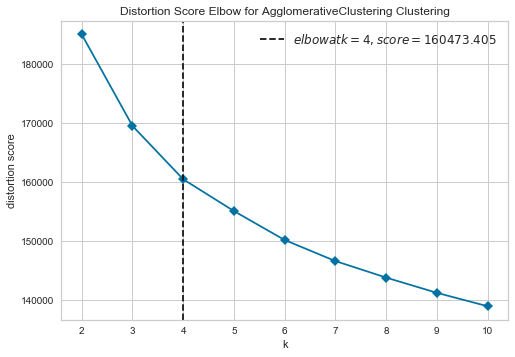

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [32]:
plot_model(hclust, 'elbow')

In [45]:
plot_model(hclust, 'distribution') #to see size of clusters

In [47]:
save_model(hclust,'Final hclust Model 18Sep 2020')


Transformation Pipeline and Model Succesfully Saved


In [48]:
saved_hclust = load_model('Final hclust Model 18Sep 2020')


Transformation Pipeline and Model Successfully Loaded
